<img src='../img/dust_banner.png' alt='Training school and workshop on dust' align='center' width='100%'></img>

<br>

# 02 - Practical exercise - Satellite II

### About

> Satellite data is also useful for understanding seasonal cycles for dust monitoring. In this session, we will use monthly IASI Level 3 Dust Aerosol Optical Depth (AOD) and Dust Aerosol Layer Height (ALH) data from January to December 2021 to create global maps of dust activity. One year is used as an illustration for how to get and use this data.


### Tasks

#### 1. Brainstorm
  * What is the difference between Level 2 and Level 3 data?
  * What are some advantages and limitations of using satellite data to monitor dust activity?

#### 2. Download and open `Dust aerosol optical depth` data from [C3S Aerosol properties gridded data](https://cds.climate.copernicus.eu/cdsapp#!/dataset/satellite-aerosol-properties?tab=overview) for the IASI instrument on MetOp-C.
  * Download the C3S Aerosol properties gridded data from January to December 2021, with the following specifications:
    > Time aggregation: `Monthly average` <br>
    > Variable on single levels: `Dust aerosol optical depth` <br>
    > Sensor on satellite: `IASI on METOPC` <br> 
    > Algorithm: `LMD (Laboratoire de Météorologie Dynamique)` <br>
    > Year: `2021` <br>
    > Month: Click on `Select all` <br>
    > Version: select `IASI` and then `v2.2` <br>
    > Orbit: `Descending` <br>
    > Format: `Zip file (.zip)` <br>
  * **Hint** 
    * [C3S Aerosol properties gridded data - Example notebook](../04_data_workflows/41_satellite_observations/418_C3S_aerosol_properties_L3_load_browse.ipynb)
    * [Data access](https://cds.climate.copernicus.eu/cdsapp#!/dataset/satellite-aerosol-properties?tab=form)

#### 3. Create an animation showing global maps of Dust AOD.

#### 4. Load and browse `Dust aerosol layer height` data from [C3S Aerosol properties gridded data](https://cds.climate.copernicus.eu/cdsapp#!/dataset/satellite-aerosol-properties?tab=overview) for the IASI instrument on MetOp-C.
  * The variable of interest is `Mean_dust_layer_altitude`

#### 5. Create an animation showing global maps of Dust aerosol layer height.

#### 6. [BONUS] Download `Dust aerosol optical depth` data from [C3S Aerosol properties gridded data](https://cds.climate.copernicus.eu/cdsapp#!/dataset/satellite-aerosol-properties?tab=overview) for the IASI instrument on MetOp-C produced with a different algorithm and compare the differences.

#### 7. Interpret the results
  * What seasonal cycles do you see in the global maps of Dust AOD over the year?
  * What seasonal cycles do you see in the global maps of Dust aerosol layer height over the year?

<br>

### Module outline
* [1 - Download and open the Dust AOD C3S Aerosol properties gridded data for the IASI instrument on MetOp-C.](#c3s_aod)
* [2 - Create an animation showing global maps of Dust AOD](#animate_aod)
* [3 - Load and browse the Dust aerosol layer height C3S Aerosol properties gridded data for the IASI instrument on MetOp-C.](#c3s_alh)
* [4 - Create an animation showing global maps of Dust aerosol layer height](#animate_alh)
* [5 - BONUS: Download Dust AOD data from C3S Aerosol properties gridded data for the IASI instrument on MetOp-C produced with a different algorithm and compare the differences.](#other)

<hr>

##### Load required libraries

In [2]:
import xarray as xr
import pandas as pd
from datetime import datetime

import matplotlib.pyplot as plt
import matplotlib.colors
from matplotlib.cm import get_cmap
from matplotlib import animation
from matplotlib.axes import Axes

import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import cartopy.feature as cfeature
from cartopy.mpl.geoaxes import GeoAxes
GeoAxes._pcolormesh_patched = Axes.pcolormesh

from IPython.display import HTML

import warnings
warnings.simplefilter(action = "ignore", category = RuntimeWarning)

##### Load helper functions

In [3]:
%run ../functions.ipynb

<hr>

### <a id='c3s_aod'></a>1. Download the Dust AOD C3S Aerosol properties gridded data for the IASI instrument on MetOp-C

In [9]:
import cdsapi

url = 'https://cds.climate.copernicus.eu/api/v2'
key = '176337:b9ec502f-8606-4f7e-9673-b6fa27212abc'

c = cdsapi.Client(url=url, key=key)

c.retrieve(
    'satellite-aerosol-properties',
    {
        'format': 'zip',
        'time_aggregation': 'monthly_average',
        'variable': 'dust_aerosol_optical_depth',
        'sensor_on_satellite': 'iasi_on_metopc',
        'algorithm': 'lmd',
        'year': '2021',
        'month': [
            '01', '02', '03',
            '04', '05', '06',
            '07', '08', '09',
            '10', '11', '12',
        ],
        'orbit': 'descending',
        'version': 'v2.2',
    },
    'download.zip')

/opt/conda/lib/python3.8/site-packages/urllib3/connectionpool.py:1013: InsecureRequestWarning: Unverified HTTPS request is being made to host 'cds.climate.copernicus.eu'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(
2023-02-27 11:55:13,558 INFO Welcome to the CDS
2023-02-27 11:55:13,559 INFO Sending request to https://cds.climate.copernicus.eu/api/v2/resources/satellite-aerosol-properties
/opt/conda/lib/python3.8/site-packages/urllib3/connectionpool.py:1013: InsecureRequestWarning: Unverified HTTPS request is being made to host 'cds.climate.copernicus.eu'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(
2023-02-27 11:55:13,679 INFO Request is queued
/opt/conda/lib/python3.8/site-packages/urllib3/connectionpool.py:1013: InsecureRequestWarning: Unverified HTTPS request is being made to 

Result(content_length=9570909,content_type=application/zip,location=https://download-0003-clone.copernicus-climate.eu/cache-compute-0003/cache/data6/dataset-satellite-aerosol-properties-2cac8d5e-4bf8-44c3-8090-2cd79b4114ea.zip)

#### Extract data

In [10]:
import zipfile
with zipfile.ZipFile('./download.zip', 'r') as zip_ref:
    zip_ref.extractall('./')

#### Load data

In [51]:
file = xr.open_mfdataset('./Data/DustAOD/*.nc', 
                         concat_dim='time', 
                         combine='nested')
file

<xarray.Dataset>
Dimensions:                   (Longitude: 360, Latitude: 180, time: 12)
Coordinates:
  * Longitude                 (Longitude) float64 -180.0 -179.0 ... 178.0 179.0
  * Latitude                  (Latitude) float64 -90.0 -89.0 -88.0 ... 88.0 89.0
Dimensions without coordinates: time
Data variables:
    Daod10000                 (time, Latitude, Longitude) float32 dask.array<chunksize=(1, 180, 360), meta=np.ndarray>
    Daod10000_uncertainty     (time, Latitude, Longitude) float32 dask.array<chunksize=(1, 180, 360), meta=np.ndarray>
    Daod11000                 (time, Latitude, Longitude) float32 dask.array<chunksize=(1, 180, 360), meta=np.ndarray>
    Daod550                   (time, Latitude, Longitude) float32 dask.array<chunksize=(1, 180, 360), meta=np.ndarray>
    Mean_dust_layer_altitude  (time, Latitude, Longitude) float32 dask.array<chunksize=(1, 180, 360), meta=np.ndarray>
Attributes: (12/44)
    title:                      Dust Aerosol Optical Depth retrieved from IAS...
    Institution:                Laboratoire de meteorologie dynamique (LMD)
    Source:                     IASI L1C (EUMETSAT)
    History:                    20210310- Product generated from LMD v2.2
    References:                 LMDAERO ATBD issue 2.2
    Tracking_id:                fbfddf53-362e-4df0-9943-61f4d967340b
    ...                         ...
    productID:                  202101-C3S-L3_AEROSOL-D_AOD-IASI-METOPC-LMDAE...
    platform:                   METOPC
    sensor:                     IASI
    spatial_resolution:         12 km diameter pixel at nadir
    content:                    Aerosol Optical Depth
    inputFileList:                  20210101-C3S-L3_AEROSOL-D_AOD-IASI-METOPC...

#### Extract dust AOD

In [52]:
# Create time idx
time_idx = pd.date_range(start='2021-01-01', end='2021-12-31', freq='1m')
time_idx = time_idx.strftime('%Y-%m')
# time_idx
file = file.assign_coords(time=time_idx)
# Extract AOD
du_aod = file['Daod550']

In [26]:
du_aod = du_aod.fillna(-999)

In [32]:
du_aod.values

array([[[-999., -999., -999., ..., -999., -999., -999.],
        [-999., -999., -999., ..., -999., -999., -999.],
        [-999., -999., -999., ..., -999., -999., -999.],
        ...,
        [-999., -999., -999., ..., -999., -999., -999.],
        [-999., -999., -999., ..., -999., -999., -999.],
        [-999., -999., -999., ..., -999., -999., -999.]],

       [[-999., -999., -999., ..., -999., -999., -999.],
        [-999., -999., -999., ..., -999., -999., -999.],
        [-999., -999., -999., ..., -999., -999., -999.],
        ...,
        [-999., -999., -999., ..., -999., -999., -999.],
        [-999., -999., -999., ..., -999., -999., -999.],
        [-999., -999., -999., ..., -999., -999., -999.]],

       [[-999., -999., -999., ..., -999., -999., -999.],
        [-999., -999., -999., ..., -999., -999., -999.],
        [-999., -999., -999., ..., -999., -999., -999.],
        ...,
        [-999., -999., -999., ..., -999., -999., -999.],
        [-999., -999., -999., ..., -999., -99

#### Get relevant attributes

In [27]:
long_name = du_aod.long_name
units = du_aod.units

latitude = du_aod.Latitude
longitude = du_aod.Longitude

In [25]:
long_name

'Dust optical depth at 0.55 microns'

#### Simple visualization

(<Figure size 1440x720 with 2 Axes>,
 <GeoAxesSubplot:title={'center':'Dust optical depth at 0.55 microns 2021-05'}>)

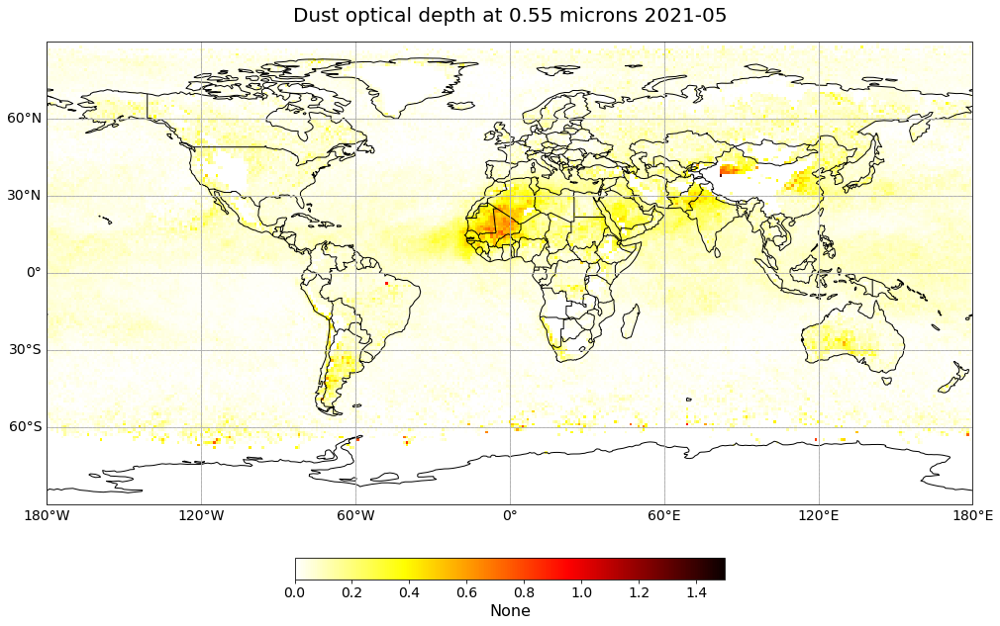

In [7]:
time_index = 4
visualize_pcolormesh(data_array=du_aod[time_index,:,:],
                     longitude=longitude,
                     latitude=latitude,
                     projection=ccrs.PlateCarree(),
                     color_scale='hot_r',
                     unit=units,
                     long_name=long_name + ' ' + str(du_aod[time_index,:,:].time.data)[0:10],
                     vmin=0, 
                     vmax=1.5)

### <a id='animate_aod'></a>2. Create an animation showing global maps of Dust AOD

In [28]:
# Setting the initial state:
# 1. Define figure for initial plot
fig, ax = visualize_pcolormesh(data_array=du_aod[0,:,:],
                               longitude=longitude, 
                               latitude=latitude,
                               projection=ccrs.PlateCarree(), 
                               color_scale='hot_r', 
                               unit='-',
                               long_name=long_name + ' '+ str(du_aod.time[0].data)[0:10],
                               vmin=0,
                               vmax=1.5)

frames = 12

def draw(i):
    img = plt.pcolormesh(longitude, 
                         latitude, 
                         du_aod[i,:,:], 
                         cmap='hot_r', 
                         transform=ccrs.PlateCarree(),
                         vmin=0,
                         vmax=1.5,
                         shading='auto')
    
    ax.set_title(long_name + ' '+ str(du_aod.time[i].data)[0:10], fontsize=20, pad=20.0)
    return img

def init():
    return fig

def animate(i):
    return draw(i)

ani = animation.FuncAnimation(fig, animate, frames, interval=800, blit=False,
                              init_func=init, repeat=True)

HTML(ani.to_html5_video())
plt.close(fig)

In [29]:
# Animation
HTML(ani.to_html5_video())

<br>

### <a id='c3s_alh'></a>3. Load and browse the Dust aerosol layer height C3S Aerosol properties gridded data for the IASI instrument on MetOp-C

In [38]:
# Download data
c.retrieve(
    'satellite-aerosol-properties',
    {
        'format': 'zip',
        'time_aggregation': 'monthly_average',
        'variable': 'dust_aerosol_layer_height',
        'sensor_on_satellite': 'iasi_on_metopc',
        'algorithm': 'lmd',
        'year': '2021',
        'month': [
            '01', '02', '03',
            '04', '05', '06',
            '07', '08', '09',
            '10', '11', '12',
        ],
        'orbit': 'descending',
        'version': 'v2.2',
    },
    'download.zip')

/opt/conda/lib/python3.8/site-packages/urllib3/connectionpool.py:1013: InsecureRequestWarning: Unverified HTTPS request is being made to host 'cds.climate.copernicus.eu'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(
2023-02-27 12:22:41,220 INFO Welcome to the CDS
2023-02-27 12:22:41,221 INFO Sending request to https://cds.climate.copernicus.eu/api/v2/resources/satellite-aerosol-properties
/opt/conda/lib/python3.8/site-packages/urllib3/connectionpool.py:1013: InsecureRequestWarning: Unverified HTTPS request is being made to host 'cds.climate.copernicus.eu'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(
2023-02-27 12:22:41,432 INFO Request is queued
/opt/conda/lib/python3.8/site-packages/urllib3/connectionpool.py:1013: InsecureRequestWarning: Unverified HTTPS request is being made to 

Result(content_length=9570909,content_type=application/zip,location=https://download-0002-clone.copernicus-climate.eu/cache-compute-0002/cache/data5/dataset-satellite-aerosol-properties-085f3612-0bd6-4ab7-acb7-25976dd7e41f.zip)

In [39]:
# Extract zip file
with zipfile.ZipFile('./download.zip', 'r') as zip_ref:
    zip_ref.extractall('./')

In [33]:
# Load data
file = xr.open_mfdataset('./Data/DustLayerHeight/*.nc', 
                         concat_dim='time', 
                         combine='nested')
file

<xarray.Dataset>
Dimensions:                   (Longitude: 360, Latitude: 180, time: 12)
Coordinates:
  * Longitude                 (Longitude) float64 -180.0 -179.0 ... 178.0 179.0
  * Latitude                  (Latitude) float64 -90.0 -89.0 -88.0 ... 88.0 89.0
Dimensions without coordinates: time
Data variables:
    Daod10000                 (time, Latitude, Longitude) float32 dask.array<chunksize=(1, 180, 360), meta=np.ndarray>
    Daod10000_uncertainty     (time, Latitude, Longitude) float32 dask.array<chunksize=(1, 180, 360), meta=np.ndarray>
    Daod11000                 (time, Latitude, Longitude) float32 dask.array<chunksize=(1, 180, 360), meta=np.ndarray>
    Daod550                   (time, Latitude, Longitude) float32 dask.array<chunksize=(1, 180, 360), meta=np.ndarray>
    Mean_dust_layer_altitude  (time, Latitude, Longitude) float32 dask.array<chunksize=(1, 180, 360), meta=np.ndarray>
Attributes: (12/44)
    title:                      Dust Aerosol Optical Depth retrieved from IAS...
    Institution:                Laboratoire de meteorologie dynamique (LMD)
    Source:                     IASI L1C (EUMETSAT)
    History:                    20210310- Product generated from LMD v2.2
    References:                 LMDAERO ATBD issue 2.2
    Tracking_id:                fbfddf53-362e-4df0-9943-61f4d967340b
    ...                         ...
    productID:                  202101-C3S-L3_AEROSOL-D_AOD-IASI-METOPC-LMDAE...
    platform:                   METOPC
    sensor:                     IASI
    spatial_resolution:         12 km diameter pixel at nadir
    content:                    Aerosol Optical Depth
    inputFileList:                  20210101-C3S-L3_AEROSOL-D_AOD-IASI-METOPC...

In [34]:
# Extract Dust layer height
# Create time idx
time_idx = pd.date_range(start='2021-01-01', end='2021-12-31', freq='1m')
time_idx = time_idx.strftime('%Y-%m')
# time_idx
file = file.assign_coords(time=time_idx)
# Extract AOD
du_lh = file['Mean_dust_layer_altitude']

<br>

In [35]:
du_lh = du_lh.fillna(-999)

In [36]:
# get relevan attributes
long_name = du_lh.long_name
units = du_lh.units

latitude = du_lh.Latitude
longitude = du_lh.Longitude

In [51]:
long_name

'Mean altitude of the layer'

(<Figure size 1440x720 with 2 Axes>,
 <GeoAxesSubplot:title={'center':'Mean altitude of the layer 2021-05'}>)

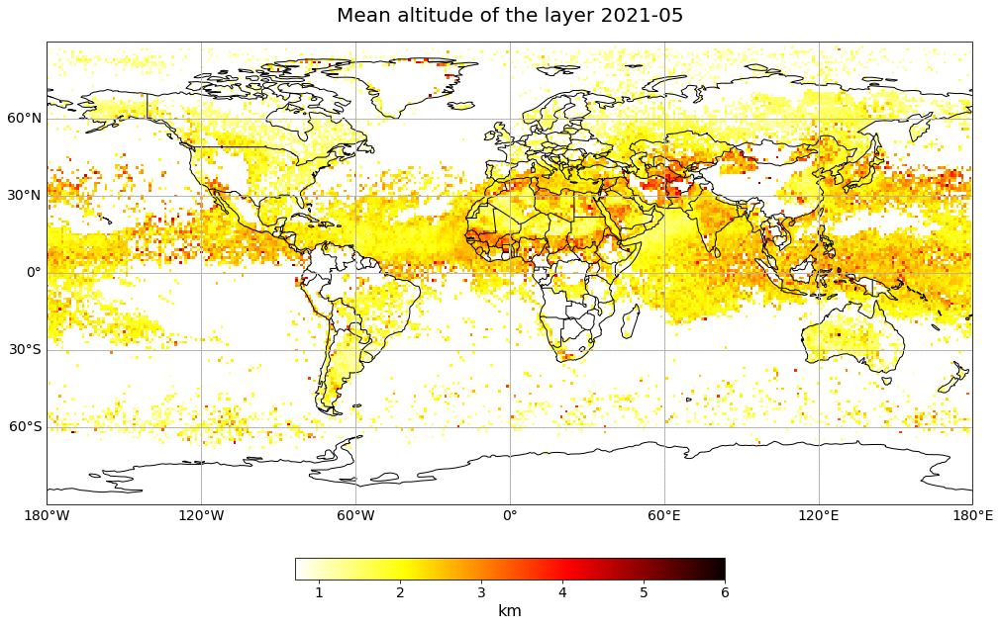

In [37]:
# Static visulaization
time_index = 4
visualize_pcolormesh(data_array=du_lh[time_index,:,:],
                     longitude=longitude,
                     latitude=latitude,
                     projection=ccrs.PlateCarree(),
                     color_scale='hot_r',
                     unit=units,
                     long_name=long_name + ' ' + str(du_lh[time_index,:,:].time.data)[0:10],
                    vmin = 0.7, vmax = 6)

### <a id='animate_alh'></a>4. Create an animation showing global maps of Dust aerosol layer height

In [38]:
# Setting the initial state:
# 1. Define figure for initial plot
fig, ax = visualize_pcolormesh(data_array=du_lh[0,:,:],
                               longitude=longitude, 
                               latitude=latitude,
                               projection=ccrs.PlateCarree(), 
                               color_scale='hot_r', 
                               unit=units,
                               long_name=long_name + ' '+ str(du_lh.time[0].data)[0:10],
                               vmin=0.7,
                               vmax=6)

frames = 12

def draw(i):
    img = plt.pcolormesh(longitude, 
                         latitude, 
                         du_lh[i,:,:], 
                         cmap='hot_r', 
                         transform=ccrs.PlateCarree(),
                         vmin=0.7,
                         vmax=6,
                         shading='auto')
    
    ax.set_title(long_name + ' '+ str(du_lh.time[i].data)[0:10], fontsize=20, pad=20.0)
    return img

def init():
    return fig

def animate(i):
    return draw(i)

ani = animation.FuncAnimation(fig, animate, frames, interval=800, blit=False,
                              init_func=init, repeat=True)

HTML(ani.to_html5_video())
plt.close(fig)

In [39]:
# Animation
HTML(ani.to_html5_video())

<br>

### <a id='other'></a>5. [BONUS] Download Dust AOD data from C3S Aerosol properties gridded data for the IASI instrument on MetOp-C produced with a different algorithm and compare the differences.

#### Download data

In [135]:
# Download data
c.retrieve(
    'satellite-aerosol-properties',
    {
        'format': 'zip',
        'variable': 'dust_aerosol_optical_depth',
        'sensor_on_satellite': 'iasi_on_metopc',
        'algorithm': 'imars',
        'year': '2021',
        'month': [
            '01', '02', '03',
            '04', '05', '06',
            '07', '08', '09',
            '10', '11', '12',
        ],
        'time_aggregation': 'monthly_average',
        'orbit': 'descending',
        'version': 'v7.0',
    },
    'download.zip')

/opt/conda/lib/python3.8/site-packages/urllib3/connectionpool.py:1013: InsecureRequestWarning: Unverified HTTPS request is being made to host 'cds.climate.copernicus.eu'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(
2023-02-27 13:28:02,773 INFO Welcome to the CDS
2023-02-27 13:28:02,774 INFO Sending request to https://cds.climate.copernicus.eu/api/v2/resources/satellite-aerosol-properties
/opt/conda/lib/python3.8/site-packages/urllib3/connectionpool.py:1013: InsecureRequestWarning: Unverified HTTPS request is being made to host 'cds.climate.copernicus.eu'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(
2023-02-27 13:28:02,790 INFO Request is queued
/opt/conda/lib/python3.8/site-packages/urllib3/connectionpool.py:1013: InsecureRequestWarning: Unverified HTTPS request is being made to 

Result(content_length=48714211,content_type=application/zip,location=https://download-0002-clone.copernicus-climate.eu/cache-compute-0002/cache/data6/dataset-satellite-aerosol-properties-b0a3cab4-0a05-4098-a223-f95f9636f4bd.zip)

In [136]:
# Extract zip file
with zipfile.ZipFile('./download.zip', 'r') as zip_ref:
    zip_ref.extractall('./')

In [48]:
# Load data
file = xr.open_mfdataset('./Data/DustAOD_ens/*.nc', 
                         concat_dim='time', 
                         combine='nested')
file

<xarray.Dataset>
Dimensions:                       (latitude: 180, longitude: 360, time: 12)
Coordinates:
  * latitude                      (latitude) float32 -89.5 -88.5 ... 88.5 89.5
  * longitude                     (longitude) float32 -179.5 -178.5 ... 179.5
Dimensions without coordinates: time
Data variables:
    DAOD550                       (time, latitude, longitude) float32 dask.array<chunksize=(1, 180, 360), meta=np.ndarray>
    NMEAS                         (time, latitude, longitude) float32 dask.array<chunksize=(1, 180, 360), meta=np.ndarray>
    DAOD550_UNCERTAINTY_ENSEMBLE  (time, latitude, longitude) float32 dask.array<chunksize=(1, 180, 360), meta=np.ndarray>
Attributes: (12/18)
    Conventions:               CF-1.6
    creator_email:             thomas.popp@dlr.de
    creator_name:              German Aerospace Center, DFD
    geospatial_lat_max:        90.0
    geospatial_lat_min:        -90.0
    geospatial_lon_max:        180.0
    ...                        ...
    sensor:                    IASI
    standard_name_vocabulary:  NetCDF Climate and Forecast (CF) Metadata Conv...
    summary:                   Level 3 aerosol properties retreived using sat...
    title:                     Ensemble aerosol product level 3
    tracking_id:               df2d8d0c-9fe9-11ec-98cb-1418773197c1
    version:                   v1.1

In [49]:
# Create time idx
time_idx = pd.date_range(start='2021-01-01', end='2021-12-31', freq='1m')
time_idx = time_idx.strftime('%Y-%m')
# time_idx
file = file.assign_coords(time=time_idx)
# Extract AOD
du_aod_ens = file['DAOD550']

In [42]:
# get relevant attributes
long_name = du_aod_ens.long_name
#units = du_aod_ens.units

latitude = du_aod_ens.latitude
longitude = du_aod_ens.longitude

In [43]:
du_aod_ens

<xarray.DataArray 'DAOD550' (time: 12, latitude: 180, longitude: 360)>
dask.array<concatenate, shape=(12, 180, 360), dtype=float32, chunksize=(1, 180, 360), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 -89.5 -88.5 -87.5 -86.5 ... 87.5 88.5 89.5
  * longitude  (longitude) float32 -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
  * time       (time) object '2021-01' '2021-02' ... '2021-11' '2021-12'
Attributes:
    long_name:      Dust aerosol optical depth at 550 nm
    standard_name:  atmosphere_optical_depth_due_to_ambient_aerosol

In [46]:
du_aod['Latitude']

<xarray.DataArray 'Latitude' (Latitude: 180)>
array([-90., -89., -88., -87., -86., -85., -84., -83., -82., -81., -80., -79.,
       -78., -77., -76., -75., -74., -73., -72., -71., -70., -69., -68., -67.,
       -66., -65., -64., -63., -62., -61., -60., -59., -58., -57., -56., -55.,
       -54., -53., -52., -51., -50., -49., -48., -47., -46., -45., -44., -43.,
       -42., -41., -40., -39., -38., -37., -36., -35., -34., -33., -32., -31.,
       -30., -29., -28., -27., -26., -25., -24., -23., -22., -21., -20., -19.,
       -18., -17., -16., -15., -14., -13., -12., -11., -10.,  -9.,  -8.,  -7.,
        -6.,  -5.,  -4.,  -3.,  -2.,  -1.,   0.,   1.,   2.,   3.,   4.,   5.,
         6.,   7.,   8.,   9.,  10.,  11.,  12.,  13.,  14.,  15.,  16.,  17.,
        18.,  19.,  20.,  21.,  22.,  23.,  24.,  25.,  26.,  27.,  28.,  29.,
        30.,  31.,  32.,  33.,  34.,  35.,  36.,  37.,  38.,  39.,  40.,  41.,
        42.,  43.,  44.,  45.,  46.,  47.,  48.,  49.,  50.,  51.,  52.,  53.,
        54.,  55.,  56.,  57.,  58.,  59.,  60.,  61.,  62.,  63.,  64.,  65.,
        66.,  67.,  68.,  69.,  70.,  71.,  72.,  73.,  74.,  75.,  76.,  77.,
        78.,  79.,  80.,  81.,  82.,  83.,  84.,  85.,  86.,  87.,  88.,  89.])
Coordinates:
  * Latitude  (Latitude) float64 -90.0 -89.0 -88.0 -87.0 ... 86.0 87.0 88.0 89.0
Attributes:
    units:        degrees_north
    long_name:    Geodetic Latitude
    valid_range:  [-90.  90.]

(<Figure size 1440x720 with 2 Axes>,
 <GeoAxesSubplot:title={'center':'Dust aerosol optical depth at 550 nm 2021-05'}>)

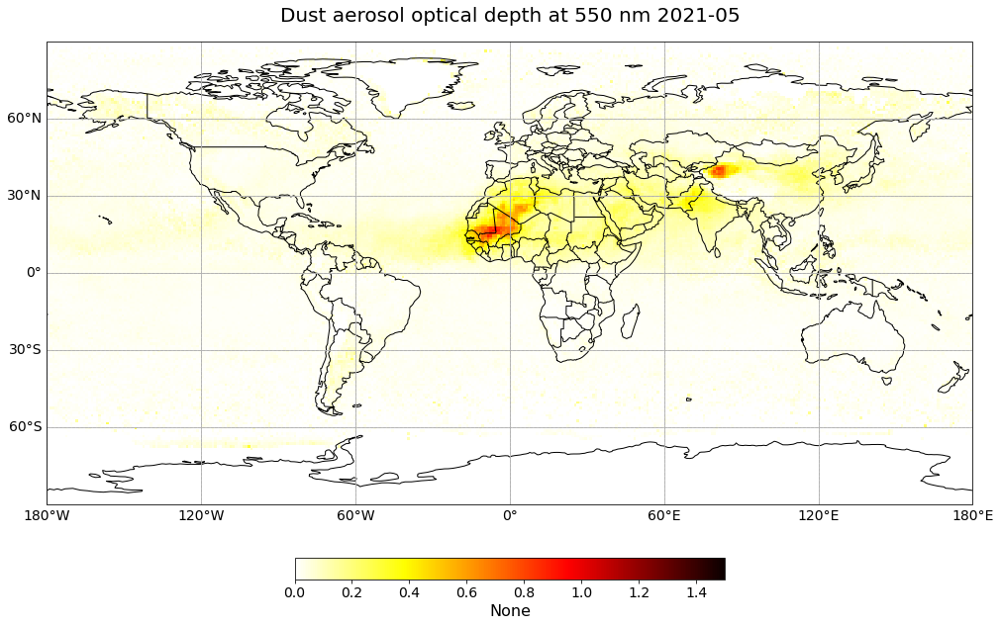

In [12]:
# Static figure
time_index = 4
visualize_pcolormesh(data_array=du_aod_ens[time_index,:,:],
                     longitude=longitude,
                     latitude=latitude,
                     projection=ccrs.PlateCarree(),
                     color_scale='hot_r',
                     unit=units,
                     long_name=long_name + ' ' + str(du_aod_ens[time_index,:,:].time.data)[0:10],
                     vmin=0, 
                     vmax=1.5)

#### Intercompare algorithm results

In [50]:
# Adjust cordinate name
du_aod_ens = du_aod_ens.rename({'latitude':'Latitude','longitude':'Longitude'})
# Resample coordinates
du_aod_ens_rs = du_aod_ens.interp(Latitude=du_aod["Latitude"], Longitude=du_aod["Longitude"])
#du_aod_rdiff = (du_aod_ens-du_aod)#/du_aod[:,:,:]

In [108]:
du_aod_rdiff = (du_aod_ens_rs-du_aod)/du_aod
# Replace inf values with Nan
du_aod_rdiff = xr.where(du_aod_rdiff==np.inf, np.nan, du_aod_rdiff)

du_aod_abdiff = (du_aod_ens_rs-du_aod)
# Replace inf values with Nan
du_aod_abdiff = xr.where(du_aod_abdiff==np.inf, np.nan, du_aod_abdiff)

In [77]:
print('Min: ',du_aod_rdiff[:,:,:].min(skipna=True).values)
print('Max: ',du_aod_rdiff[:,:,:].max(skipna=True).values)

Min:  -0.9960956714288599
Max:  20433.241699702034


In [109]:
print('Min: ',du_aod_abdiff[:,:,:].min(skipna=True).values)
print('Max: ',du_aod_abdiff[:,:,:].max(skipna=True).values)

Min:  -1.4781533060595393
Max:  0.4113197475671768


(<Figure size 1440x720 with 2 Axes>,
 <GeoAxesSubplot:title={'center':'Dust aerosol optical depth at 550 nm 2021-05'}>)

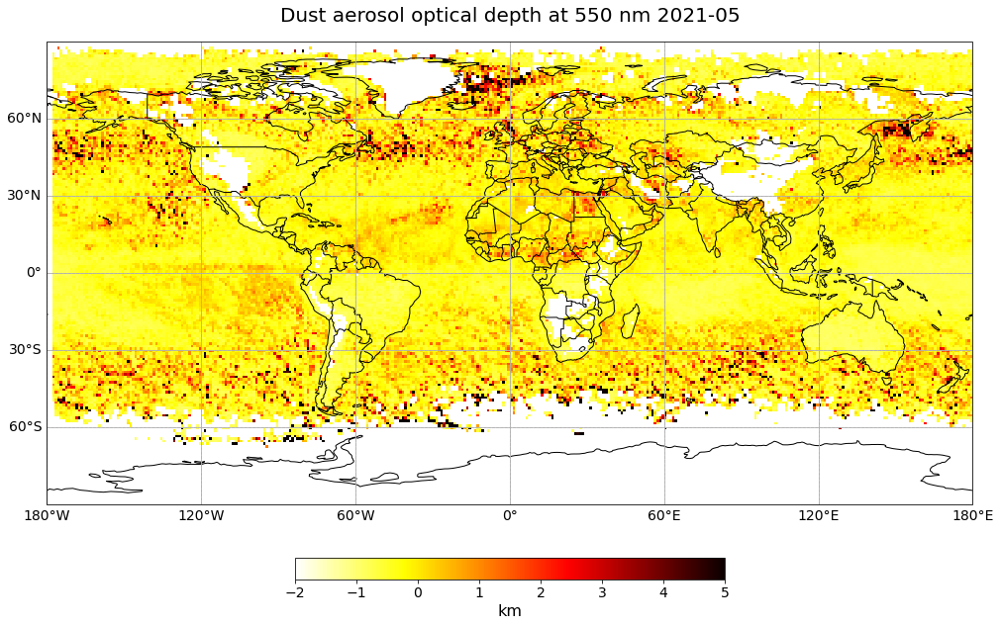

In [79]:
# Static figure
time_index = 4
visualize_pcolormesh(data_array=du_aod_rdiff[time_index,:,:],
                     longitude=longitude,
                     latitude=latitude,
                     projection=ccrs.PlateCarree(),
                     color_scale='hot_r',
                     unit=units,
                     long_name=long_name + ' ' + str(du_aod[time_index,:,:].time.data)[0:10],
                     vmin=-2, 
                     vmax=+5)

In [91]:
# Define new colormesh func
def visualize_pcolormesh_mod(ax, data_array, longitude, latitude, color_scale, unit, long_name, vmin, vmax, 
                         projection, set_global=True, lonmin=-180, lonmax=180, latmin=-90, latmax=90):
    """ 
    Visualizes a xarray.DataArray with matplotlib's pcolormesh function.
    
    Parameters:
        data_array(xarray.DataArray): xarray.DataArray holding the data values
        longitude(xarray.DataArray): xarray.DataArray holding the longitude values
        latitude(xarray.DataArray): xarray.DataArray holding the latitude values
        projection(str): a projection provided by the cartopy library, e.g. ccrs.PlateCarree()
        color_scale(str): string taken from matplotlib's color ramp reference
        unit(str): the unit of the parameter, taken from the NetCDF file if possible
        long_name(str): long name of the parameter, taken from the NetCDF file if possible
        vmin(int): minimum number on visualisation legend
        vmax(int): maximum number on visualisation legend
        set_global(boolean): optional kwarg, default is True
        lonmin,lonmax,latmin,latmax(float): optional kwarg, set geographic extent is set_global kwarg is set to 
                                            False

    """
   
    pcm = ax.pcolormesh(longitude, latitude, data_array, 
                        cmap=plt.get_cmap(color_scale), transform=ccrs.PlateCarree(),
                        vmin=vmin,
                        vmax=vmax,
                        shading='auto')

    ax.add_feature(cfeature.BORDERS, edgecolor='black', linewidth=1)
    ax.add_feature(cfeature.COASTLINE, edgecolor='black', linewidth=1)

    if (projection==ccrs.PlateCarree()):
        ax.set_extent([lonmin, lonmax, latmin, latmax], projection)
        gl = ax.gridlines(draw_labels=True, linestyle='--')
        gl.top_labels=False
        gl.right_labels=False
        gl.xformatter=LONGITUDE_FORMATTER
        gl.yformatter=LATITUDE_FORMATTER
        gl.xlabel_style={'size':14}
        gl.ylabel_style={'size':14}

    if(set_global):
        ax.set_global()
        ax.gridlines()

    #cbar = fig.colorbar(img, ax=ax, orientation='horizontal', fraction=0.04, pad=0.1)
    #cbar.set_label(unit, fontsize=16)
    #cbar.ax.tick_params(labelsize=14)
    ax.set_title(long_name, fontsize=20, pad=20.0)
    return(pcm)

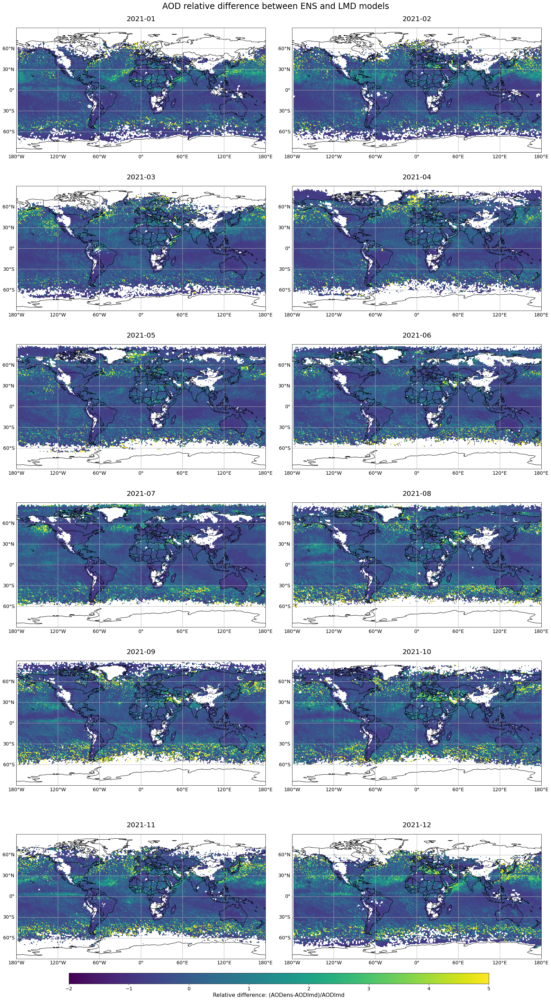

In [115]:
# Plot the different algo AOD
import numpy.ma as ma

fig, axs = matplotlib.pyplot.subplots(figsize = (22,40), nrows = 6, ncols = 2, sharex = True, sharey = True,
                                      subplot_kw={'projection': ccrs.PlateCarree()}, constrained_layout=True)
for j,k in enumerate(axs.flat):
    pcm = visualize_pcolormesh_mod(ax=axs.flat[j],data_array=ma.masked_invalid(du_aod_rdiff[j,:,:]),
                     longitude=longitude,
                     latitude=latitude,
                     color_scale='viridis',
                     unit=units,
                     projection = ccrs.PlateCarree(),
                     long_name=str(du_aod[j,:,:].time.data),
                     vmin=-2, 
                     vmax=5)

cbar = fig.colorbar(pcm, ax=axs[5, :],  aspect = 40, shrink = 0.8, location='bottom')
#cbar.set_label(unit, fontsize=16)
cbar.ax.tick_params(labelsize=14)
cbar.set_label('Relative difference: (AODens-AODlmd)/AODlmd', fontsize = 16)
fig.suptitle('AOD relative difference between ENS and LMD models',fontsize = 24)
plt.savefig('AOD_reldiff.png', dpi = 150)

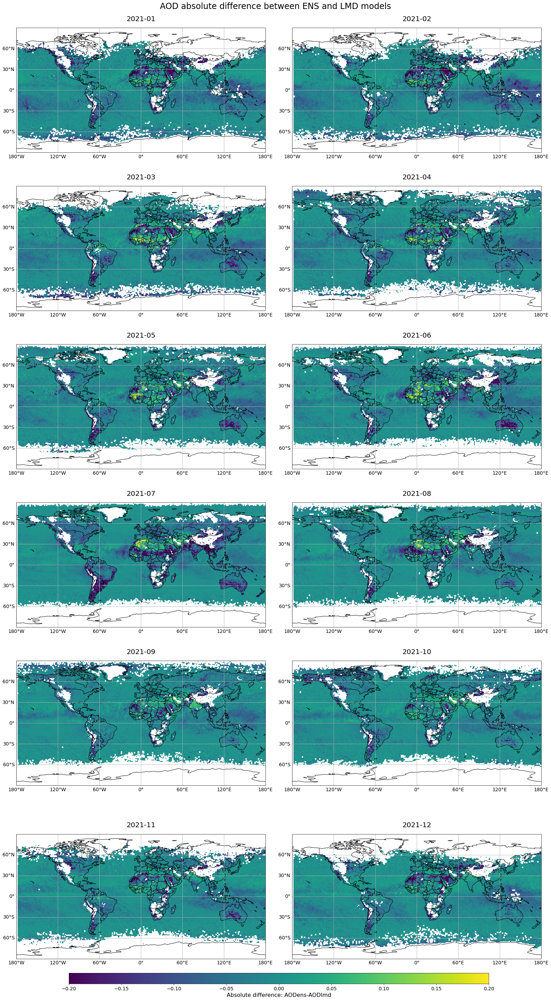

In [116]:
import numpy.ma as ma

fig, axs = matplotlib.pyplot.subplots(figsize = (22,40), nrows = 6, ncols = 2, sharex = True, sharey = True,
                                      subplot_kw={'projection': ccrs.PlateCarree()}, constrained_layout=True)
for j,k in enumerate(axs.flat):
    pcm = visualize_pcolormesh_mod(ax=axs.flat[j],data_array=ma.masked_invalid(du_aod_abdiff[j,:,:]),
                     longitude=longitude,
                     latitude=latitude,
                     color_scale='viridis',
                     unit=units,
                     projection = ccrs.PlateCarree(),
                     long_name=str(du_aod[j,:,:].time.data),
                     vmin=-0.2, 
                     vmax=0.2)

cbar = fig.colorbar(pcm, ax=axs[5, :],  aspect = 40, shrink = 0.8, location='bottom')
#cbar.set_label(unit, fontsize=16)
cbar.ax.tick_params(labelsize=14)
cbar.set_label('Absolute difference: AODens-AODlmd', fontsize = 16)
fig.suptitle('AOD absolute difference between ENS and LMD models',fontsize = 24)
plt.savefig('AOD_abdiff.png', dpi = 150)

< GeoAxes: +proj=eqc +ellps=WGS84 +a=6378137.0 +lon_0=0.0 +to_meter=111319.4907932736 +vto_meter=1 +no_defs +type=crs >
0
< GeoAxes: +proj=eqc +ellps=WGS84 +a=6378137.0 +lon_0=0.0 +to_meter=111319.4907932736 +vto_meter=1 +no_defs +type=crs >
1
< GeoAxes: +proj=eqc +ellps=WGS84 +a=6378137.0 +lon_0=0.0 +to_meter=111319.4907932736 +vto_meter=1 +no_defs +type=crs >
2
< GeoAxes: +proj=eqc +ellps=WGS84 +a=6378137.0 +lon_0=0.0 +to_meter=111319.4907932736 +vto_meter=1 +no_defs +type=crs >
3
< GeoAxes: +proj=eqc +ellps=WGS84 +a=6378137.0 +lon_0=0.0 +to_meter=111319.4907932736 +vto_meter=1 +no_defs +type=crs >
4
< GeoAxes: +proj=eqc +ellps=WGS84 +a=6378137.0 +lon_0=0.0 +to_meter=111319.4907932736 +vto_meter=1 +no_defs +type=crs >
5
< GeoAxes: +proj=eqc +ellps=WGS84 +a=6378137.0 +lon_0=0.0 +to_meter=111319.4907932736 +vto_meter=1 +no_defs +type=crs >
6
< GeoAxes: +proj=eqc +ellps=WGS84 +a=6378137.0 +lon_0=0.0 +to_meter=111319.4907932736 +vto_meter=1 +no_defs +type=crs >
7
< GeoAxes: +proj=eqc +el

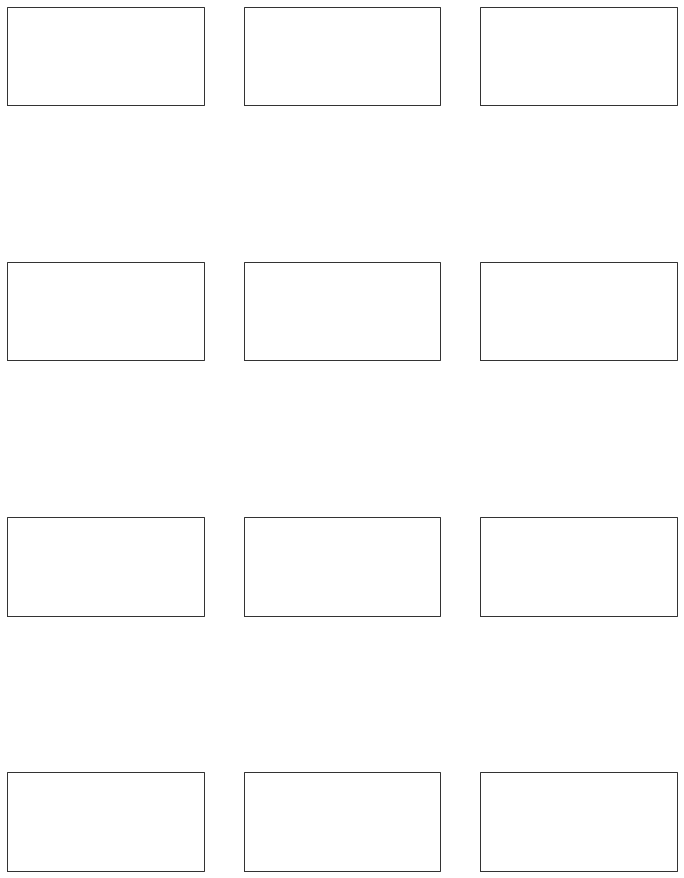

In [89]:
fig, axs = matplotlib.pyplot.subplots(figsize = (22,40), nrows = 12, ncols = 2, sharex = True, sharey = True,
                                      subplot_kw={'projection': ccrs.PlateCarree()})
for j,k in enumerate(axs.flat):
    visualize_pcolormesh_mod(ax=axs.flat[j],data_array=du_aod_ens[j,:,:],
                     longitude=longitude,
                     latitude=latitude,
                     color_scale='hot_r',
                     unit=units,
                     projection = ccrs.PlateCarree(),
                     long_name=str(du_aod[j,:,:].time.data),
                     vmin=0, 
                     vmax=1.5)

<br>

<hr>

<img src='../img/copernicus_logo.png' alt='Logo EU Copernicus' align='left' width='20%'><br><br><br><br>
This project is licensed under <a href="../../LICENSE">GNU General Public License v3.0 only</a> and is developed under a Copernicus contract.

<p style="text-align:right;"> <a href='https://training.eumetsat.int'>EUMETSAT Training</a> | <a href='mailto:training@eumetsat.int'>Contact the training team</a></p>